In [1]:
using Pkg
Pkg.activate(".")

  Activating project at `~/PhD/GaussianProcessNode`


In [2]:
using Revise 
using StableRNGs, Random, Distributions, LinearAlgebra, Plots, DSP
using SpecialFunctions, Optim, Flux, Zygote, ForwardDiff
using WAV, MAT
using BenchmarkTools
using GraphPPL,ReactiveMP, RxInfer
import ReactiveMP: GaussHermiteCubature, approximate_meancov
import KernelFunctions: SqExponentialKernel, Matern52Kernel, with_lengthscale, Kernel, kernelmatrix  

## On synthetic data 

In [3]:
function generate_cleandata(n, f_gp, c_gp)
    y=Float64[]
    obs = []
    for i=1:n
        temp = c_gp[i] * exp(f_gp[i]) 
        push!(y,temp)
    end
    return y
end

generate_cleandata (generic function with 1 method)

In [4]:
N = 500; #data length
n = 500; #lenght of the axis of gp 
θcarrier   = 0.01
θamplitude = 1.
mean_amplitude = (x) -> 0;
mean_carrier   = (x) -> 0.;
kernel_carrier(θ)     =  0.5with_lengthscale(Matern52Kernel(),θ)
kernel_amplitude(θ)   =  with_lengthscale(Matern52Kernel(),θ) #+ with_lengthscale(PeriodicKernel(),3.0)
tmin,tmax = 0., 5.0
time_range = collect(range(tmin, tmax; length=n));
Cov_amplitude = kernelmatrix(kernel_amplitude(θamplitude),time_range,time_range) + 1e-7*I;
Cov_carrier   = kernelmatrix(kernel_carrier(θcarrier),time_range,time_range) + 1e-7I;
gp_amplitude  = MvNormal(mean_amplitude.(time_range), Cov_amplitude)
gp_carrier    = MvNormal(mean_carrier.(time_range), Cov_carrier)
amplitude_gt = rand(StableRNG(1133),gp_amplitude)
carrier_gt   = rand(StableRNG(11), gp_carrier)


#Generate data 
y_data_synthetic = generate_cleandata(n,amplitude_gt,carrier_gt);
slicedim(dim) = (a) -> map(e -> e[dim], a);

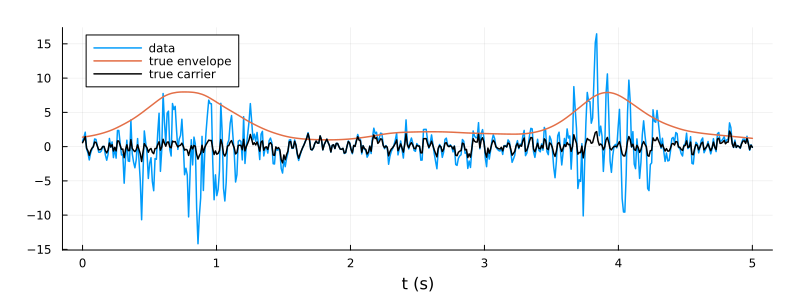

In [74]:
plot(time_range, y_data_synthetic,size=(800,300), lw=1.5, label="data",margin=5Plots.mm)
plot!(time_range,exp.(amplitude_gt), lw=1.5, label="true envelope")
plot!(time_range,carrier_gt, lw=1.5, color=:black, label="true carrier")
xlabel!("t (s)")


In [ ]:
savefig("synthetic_data.png")

### HE method

In [26]:
# HE method 
HE_env_synthetic = abs.(hilbert(y_data_synthetic));
HE_carrier_synthetic = y_data_synthetic ./ HE_env_synthetic;

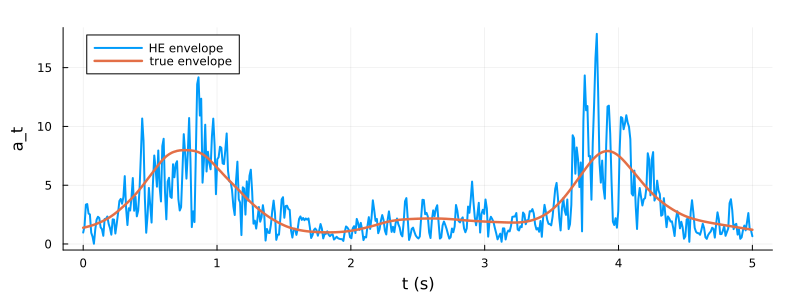

In [91]:
plot(time_range, HE_env_synthetic,size = (800,300),linewidth=2, label= "HE envelope",margin=5Plots.mm)
plot!(time_range, exp.(amplitude_gt), label="true envelope", lw=2.5)
ylabel!("a_t")
xlabel!("t (s)")

In [92]:
savefig("Synthe_HEenvelope.png")

"/Users/nguyenhuuminhhoang/PhD/GaussianProcessNode/Synthe_HEenvelope.png"

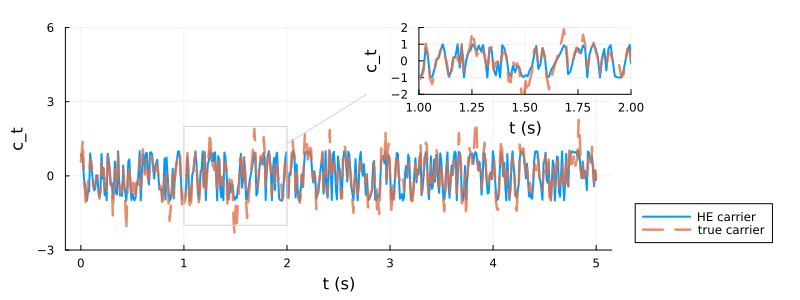

In [89]:
from_a = 1 
to = length(y_data_synthetic)
skip_a = 1

plot(time_range[from_a:skip_a:to], HE_carrier_synthetic[from_a:skip_a:to],size = (800,300),linewidth=2, label= "HE carrier", margin=5Plots.mm)
plot!(time_range[from_a:skip_a:to], carrier_gt[from_a:skip_a:to], label = "true carrier", lw=2.5,alpha=.8,ls=:dash, legend=:outerbottomright)
ylims!(-3., 6.)
lens!([1, 2], [-2, 2], inset = (1, bbox(.5, .0, 0.3, 0.3)))
ylabel!("c_t")
xlabel!("t (s)")

In [90]:
savefig("Synthe_HEcarrier.png")

"/Users/nguyenhuuminhhoang/PhD/GaussianProcessNode/Synthe_HEcarrier.png"

### SLP method

In [40]:
#create a low-pass filter
Δt = time_range[2] - time_range[1]
cutoff_freq= 1
responsetype = Lowpass(cutoff_freq; fs=1/Δt)
designmethod = FIRWindow(hanning(128))
lowpassFilter = (x) -> filtfilt(digitalfilter(responsetype, designmethod), x)

#square the signal 
y_squared_synthetic = 2*y_data_synthetic.^2;
SLP_env_squared_synthetic = lowpassFilter(y_squared_synthetic);
SLP_env_synthetic = sqrt.(SLP_env_squared_synthetic .+ 1e-6);
SLP_carrier_synthetic = y_data_synthetic ./ SLP_env_synthetic;

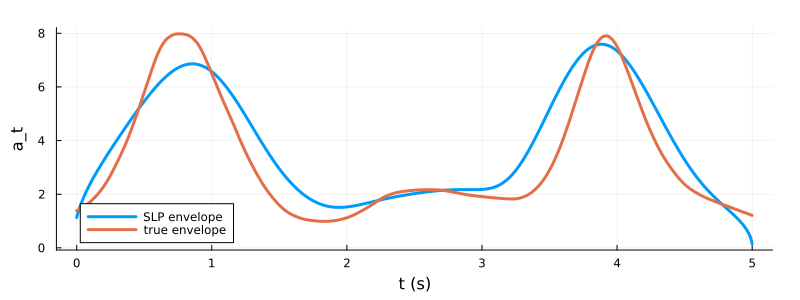

In [79]:
# from = 1 
# to = length(y_data_synthetic)
# skip = 10

plot(time_range[from_a:skip_a:to], SLP_env_synthetic[from_a:skip_a:to], lw = 3.0,size=(800,300), label="SLP envelope",margin=5Plots.mm)
plot!(time_range[from_a:skip_a:to], exp.(amplitude_gt[from_a:skip_a:to]), lw = 3., label="true envelope")
ylabel!("a_t")
xlabel!("t (s)")

In [80]:
savefig("Synthe_SLPenvelope.png")

"/Users/nguyenhuuminhhoang/PhD/GaussianProcessNode/Synthe_SLPenvelope.png"

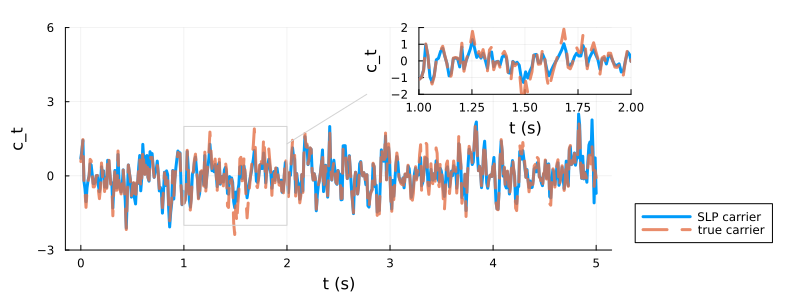

In [81]:
plot(time_range, SLP_carrier_synthetic,size = (800,300),linewidth=3., label= "SLP carrier",margin=5Plots.mm)
plot!(time_range, carrier_gt,linewidth=3., label= "true carrier",alpha=0.8,ls=:dash,legend=:outerbottomright)

ylims!(-3., 6.)
lens!([1, 2.], [-2, 2], inset = (1, bbox(.5, .0, 0.3, 0.3)))
ylabel!("c_t")
xlabel!("t (s)")

In [82]:
savefig("Synthe_SLPcarrier.png")

"/Users/nguyenhuuminhhoang/PhD/GaussianProcessNode/Synthe_SLPcarrier.png"

## GP-PAD(2)

In [6]:
#Exponentiate function 
struct MyExponential end

@node MyExponential Deterministic [ y, x ]   ## x: input,  y: output


@rule MyExponential(:y, Marginalisation) (m_x::UnivariateGaussianDistributionsFamily,) = begin 
    return LogNormal(mean(m_x), var(m_x))
end

@rule MyExponential(:x, Marginalisation) (m_y::ContinuousUnivariateLogPdf, m_x::UnivariateGaussianDistributionsFamily, ) = begin 
    dist = m_x    
    m_in, var_in = mean_var(m_x)
    l_pdf = (x) -> logpdf(m_y,exp.(x)) 
    pdf = x -> exp(l_pdf(x)-logpdf(dist,x)+1e-7)
    m,v = approximate_meancov(ghcubature(131),pdf,dist)

    if isnan(v) || isnan(m)
        log_pdf = x -> l_pdf(x) + logpdf(dist,x[1])  + 1e-7
        res = optimize(x -> -log_pdf(x), [m_in])
        mproxy = res.minimizer[1]
        dx  = x -> ForwardDiff.derivative(y -> -log_pdf(y),x)
        ddx = x -> ForwardDiff.derivative(dx, x)

        vproxy = cholinv(ddx(mproxy+tiny))
        m_ = mproxy 
        v_ = vproxy + 1e-6

        ksi = m_/v_ - m_in/var_in
        precision = clamp(1/v_ - 1/var_in, tiny,huge)

        if isnan(ksi) || isnan(precision)
            samples = rand(dist,3000)
            weights = exp.(l_pdf.(samples)) / sum(exp.(l_pdf.(samples)) )
            if any(isnan.(weights)) 
                m_ = sum(samples)/3000
                v_ = sum((samples .- m_).^2) /3000 
            else
                m_ = sum(weights .* samples)
                v_ = sum(weights .* (samples .- m_).^2)    
            end
            ksi = m_/v_ - m_in/var_in
            precision = clamp(1/v_ - 1/var_in, tiny,huge)
            
            return NormalWeightedMeanPrecision(ksi,precision)
        else
            return  NormalWeightedMeanPrecision(ksi,precision)
        end
    else
        return  NormalMeanVariance(m,v)
    end
end

In [17]:
#use Gaussian GaussHermiteCubature to approximate 
#Temporarily put here 
# function ReactiveMP.prod(::ProdAnalytical, left::UnivariateGaussianDistributionsFamily, right::ContinuousUnivariateLogPdf) 
#     #we use Gaussian Hermite Cubature here, not ProdAnalytical 
#     meta = GaussHermiteCubature(121)
#     m,v = ReactiveMP.approximate_meancov(meta, z -> exp(right.logpdf(z)), mean(left), var(left))
#     return NormalMeanVariance(m,v)
# end

# function ReactiveMP.prod(::ProdAnalytical, left::ContinuousUnivariateLogPdf, right::UnivariateGaussianDistributionsFamily)
#     meta = GaussHermiteCubature(121)
#     m,v = ReactiveMP.approximate_meancov(meta, z -> exp(left.logpdf(z)), mean(right), var(right))
#     return NormalMeanVariance(m,v)
# end


# function ReactiveMP.prod(::ProdAnalytical, left::LogNormal, right::ContinuousUnivariateLogPdf) 
#     sample_left = rand(left,2000)
#     weights = [exp(logpdf(right,sample_left[i])) for i=1:length(sample_left)]
#     weight = weights / sum(weights)
#     m = sum(weight .* log.(sample_left))
#     v = sum(weight .* (log.(sample_left) .- m).^2)
#     return LogNormal(m,v)
# end

# function ReactiveMP.prod(::ProdAnalytical, left::LogNormal, right::ContinuousUnivariateLogPdf) 
#     sample_left = rand(left,500)
#     f_samples_evaluated = [exp(logpdf(right,sample_left[i])) for i=1:length(sample_left)]
#     p_samples_evaluated = [pdf(left,sample_left[i]) for i=1:length(sample_left)]
#     m = sum(sample_left .* p_samples_evaluated .* f_samples_evaluated)
#     v = sum((sample_left .- m).^2 .* p_samples_evaluated .* f_samples_evaluated)
#     if isnan(v)
#         k = sample_left .* p_samples_evaluated .* f_samples_evaluated
#         for i =1:length(k) 
#             if isnan(k[i])
#                 sample_left[i] = 1e-2
#             end
#         end
#         f_samples_evaluated = [exp(logpdf(right,sample_left[i])) for i=1:length(sample_left)]
#         p_samples_evaluated = [pdf(left,sample_left[i]) for i=1:length(sample_left)]
#         m = sum(sample_left .* p_samples_evaluated .* f_samples_evaluated)
#         v = sum((sample_left .- m).^2 .* p_samples_evaluated .* f_samples_evaluated)
#     end
#     return LogNormal(m,v)
# end

In [11]:
# @rule typeof(*)(:A, Marginalisation) (m_out::UnivariateGaussianDistributionsFamily, m_A::UnivariateGaussianDistributionsFamily, m_in::LogNormal, meta::TinyCorrection) = begin 
#     #mean_in and var_in come from m_A
#     backward_A = @call_rule typeof(*)(:A, Marginalisation) (m_out = m_out, m_in = m_in, meta=meta)
#     mean_in, var_in = mean_var(m_A)
#     dist = m_A 
#     pdf = x -> exp(backward_A(x)-logpdf(dist,x)+1e-7)
#     m,v = approximate_meancov(ghcubature(121),pdf,dist)

#     if isnan(v) || isnan(m)
#         log_pdf = x -> backward_A(x) + logpdf(dist,x[1])  + 1e-7
#         res = optimize(x -> -log_pdf(x), [mean_in])
#         mproxy = res.minimizer[1]
#         dx  = x -> ForwardDiff.derivative(y -> -log_pdf(y),x)
#         ddx = x -> ForwardDiff.derivative(dx, x)

#         vproxy = cholinv(ddx(mproxy+tiny))
#         m_ = mproxy 
#         v_ = vproxy + 1e-6

#         ksi = m_/v_ - mean_in/var_in
#         precision = clamp(1/v_ - 1/var_in, tiny,huge)

#         if isnan(ksi) || isnan(precision)
#             samples = rand(dist,3000)
#             weights = exp.(backward_A.(samples)) / sum(exp.(backward_A.(samples)) )
#             if any(isnan.(weights)) 
#                 m_ = sum(samples)/3000
#                 v_ = sum((samples .- m_).^2) /3000
#             else
#                 m_ = sum(weights .* samples)
#                 v_ = sum(weights .* (samples .- m_).^2)    
#             end
#             ksi = m_/v_ - mean_in/var_in
#             precision = clamp(1/v_ - 1/var_in, tiny,huge)
            
#             return NormalWeightedMeanPrecision(ksi,precision)
#         else
#             return  NormalWeightedMeanPrecision(ksi,precision)
#         end
#     else
#         return  NormalMeanVariance(m,v)
#     end
# end

@rule typeof(*)(:A, Marginalisation) (m_out::PointMass, m_A::UnivariateGaussianDistributionsFamily, m_in::LogNormal, meta::TinyCorrection) = begin 
    backward_A = (x) -> -log(abs(x)) + logpdf(m_in,mean(m_out)/x)
    mean_in, var_in = mean_var(m_A)
    dist = m_A 
    pdf = x -> exp(backward_A(x)-logpdf(dist,x)+1e-7)
    m,v = approximate_meancov(ghcubature(121),pdf,dist)

    if isnan(v) || isnan(m)
        log_pdf = x -> backward_A(x[1]) + logpdf(dist,x[1])  + 1e-7
        res = optimize(x -> -log_pdf(x), [mean_in])
        mproxy = res.minimizer[1]
        dx  = x -> ForwardDiff.derivative(y -> -log_pdf(y),x)
        ddx = x -> ForwardDiff.derivative(dx, x)

        vproxy = cholinv(ddx(mproxy+tiny))
        m_ = mproxy 
        v_ = vproxy + 1e-6

        ksi = m_/v_ - mean_in/var_in
        precision = clamp(1/v_ - 1/var_in, tiny,huge)

        if isnan(ksi) || isnan(precision)
            samples = rand(dist,3000)
            weights = exp.(backward_A.(samples)) / sum(exp.(backward_A.(samples)) )
            if any(isnan.(weights)) 
                m_ = sum(samples)/3000
                v_ = sum((samples .- m_).^2) /3000
            else
                m_ = sum(weights .* samples)
                v_ = sum(weights .* (samples .- m_).^2)    
            end
            ksi = m_/v_ - mean_in/var_in
            precision = clamp(1/v_ - 1/var_in, tiny,huge)
            
            return NormalWeightedMeanPrecision(ksi,precision)
        else
            return  NormalWeightedMeanPrecision(ksi,precision)
        end
    else
        return  NormalMeanVariance(m,v)
    end
end

@rule typeof(*)(:A, Marginalisation) (m_out::PointMass, m_in::UnivariateGaussianDistributionsFamily, meta::TinyCorrection) = begin 
    backward_A = (x) -> -log(abs(x)) + logpdf(m_in,mean(m_out)/x)
    return ContinuousUnivariateLogPdf(backward_A)
end


In [8]:
#GP Amplitude Demodulation model 
@model function gp_AmplitudeDemodulation(n, P∞_amplitude,A_amplitude,Q_amplitude,P∞_carrier,A_carrier,Q_carrier,H)
    y = datavar(Float64,n)
    f = randomvar(n)
    z = randomvar(n)
    g = randomvar(n)
    c = randomvar(n)
    # w = randomvar(n)
    d = randomvar(n)
    
    f_0 ~ MvNormalMeanCovariance(zeros(length(H)), P∞_amplitude)
    c_0 ~ MvNormalMeanCovariance(zeros(length(H)), P∞_carrier)
    f_prev = f_0
    c_prev = c_0
    for i=1:n 
        f[i] ~ MvNormalMeanCovariance(A_amplitude[i] * f_prev, Q_amplitude[i])
        z[i] ~ NormalMeanVariance(dot(H , f[i]), .1)
        g[i] ~ MyExponential(z[i]) where {pipeline = RequireMessage(x = NormalMeanPrecision(0., .1))}

        c[i] ~ MvNormalMeanCovariance(A_carrier[i] * c_prev, Q_carrier[i])
        d[i] ~ NormalMeanVariance(dot(H, c[i]), .1) 

        y[i] ~ (*)(d[i],g[i]) where {meta = TinyCorrection(), pipeline = RequireMessage(A = NormalMeanPrecision(0., .1))}
        f_prev = f[i]
        c_prev = c[i]
    end
end

In [9]:
#### compute matrices for the state-space model corresponding to Matern-52 kernel ######
θ_amplitude = [1., 1.]; # store [l, σ²]
θ_carrier = [0.01, .5]; # store [l, σ²]

Δt = [time_range[2] - time_range[1]]; # time difference
append!(Δt, time_range[2:end] - time_range[1:end-1]);

λ_amplitude = sqrt(5)/θ_amplitude[1];
λ_carrier = sqrt(5)/θ_carrier[1];

L = [0., 0., 1.];
H = [1., 0., 0.];

F_amplitude = [0. 1. 0.; 0. 0. 1.;-λ_amplitude^3 -3λ_amplitude^2 -3λ_amplitude]
F_carrier = [0. 1. 0.; 0. 0. 1.;-λ_carrier^3 -3λ_carrier^2 -3λ_carrier]

Qc_amplitude = 16/3 * θ_amplitude[2] * λ_amplitude^5;
Qc_carrier = 16/3 * θ_carrier[2] * λ_carrier^5;

Imat = diageye(3) ; 

vec_P_amplitude = inv(kron(Imat,F_amplitude) + kron(F_amplitude,Imat)) * vec(-L * Qc_amplitude * L'); 
vec_P_carrier = inv(kron(Imat,F_carrier) + kron(F_carrier,Imat)) * vec(-L * Qc_carrier * L'); 

P∞_amplitude = reshape(vec_P_amplitude,3,3);
P∞_carrier = reshape(vec_P_carrier,3,3);

A_amplitude = [exp(F_amplitude * i) for i in Δt]; 
Q_amplitude = [P∞_amplitude - i*P∞_amplitude*i' for i in A_amplitude];

A_carrier = [exp(F_carrier * i) for i in Δt]; 
Q_carrier = [P∞_carrier - i*P∞_carrier*i' for i in A_carrier];

In [12]:
nits =10

iresult = inference(
    model = gp_AmplitudeDemodulation(length(y_data_synthetic), P∞_amplitude,A_amplitude,Q_amplitude, P∞_carrier,A_carrier,Q_carrier,H),
    iterations = nits, 
    data  = (y = y_data_synthetic,),
    returnvars = (f = KeepLast(),c = KeepLast(),),
    options = (limit_stack_depth=500,),
    showprogress = false
)

Inference results:
  Posteriors       | available for (f, c)


In [17]:
mgp = mean.(iresult.posteriors[:f]) |> slicedim(1)
vgp = var.(iresult.posteriors[:f]) |> slicedim(1)
var_PAD_env = exp.( mgp .+ vgp)
PAD_env_synthetic = exp.(mgp);

PAD_carrier_synthetic = mean.(iresult.posteriors[:c]) |> slicedim(1)
var_PAD_carrier = var.(iresult.posteriors[:c]) |> slicedim(1);


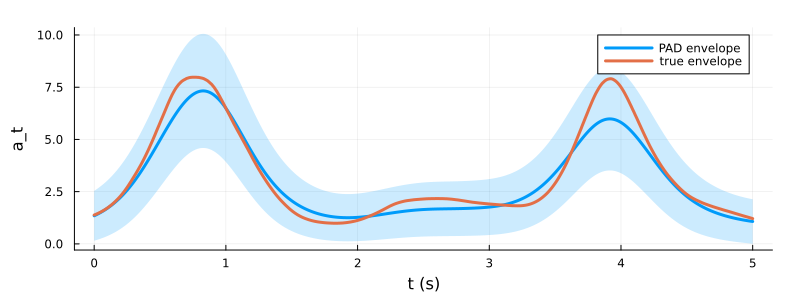

In [83]:
plot(time_range,PAD_env_synthetic,ribbon=sqrt.(var_PAD_env),linewidth=3.0,label="PAD envelope",fillalpha=0.2, size = (800, 300),margin=5Plots.mm)
plot!(time_range,exp.(amplitude_gt), label="true envelope",linewidth=3.0)
# plot!(time_range,y_data_synthetic)
ylabel!("a_t")
xlabel!("t (s)")

In [84]:
savefig("Synthe_PADenv.png")

"/Users/nguyenhuuminhhoang/PhD/GaussianProcessNode/Synthe_PADenv.png"

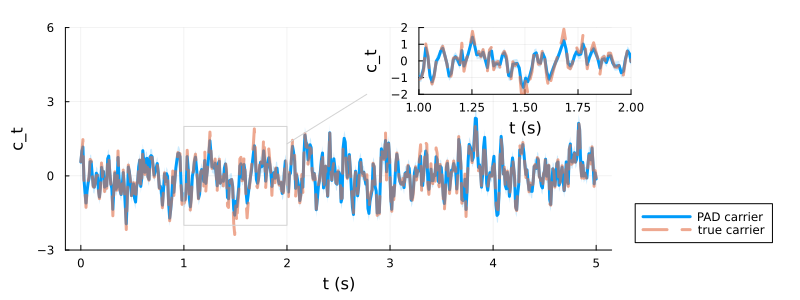

In [85]:
from_a = 1 
to = length(y_data_synthetic)
skip_a = 1

plot(time_range[from_a:skip_a:to], PAD_carrier_synthetic[from_a:skip_a:to],ribbon=sqrt.((var_PAD_carrier)),label="PAD carrier",linewidth=3.0, fillalpha=0.2, size=(800,300),margin=5Plots.mm)
plot!(time_range[from_a:skip_a:to], carrier_gt[from_a:skip_a:to],linewidth=3.0, label="true carrier",alpha=0.6,ls=:dash, legend=:outerbottomright)

ylims!(-3., 6.)
lens!([1, 2], [-2, 2], inset = (1, bbox(.5, .0, 0.3, 0.3)))
ylabel!("c_t")
xlabel!("t (s)")

In [86]:
savefig("Synthe_PADcarrier.png")

"/Users/nguyenhuuminhhoang/PhD/GaussianProcessNode/Synthe_PADcarrier.png"

## SNR

In [249]:
function SNR(signal, noise)
    N = length(signal)
    P_signal = sum(abs.(signal).^2) / N
    P_noise = sum(abs.(noise).^2) / N

    return 10*log10(P_signal / P_noise)
end

SNR (generic function with 1 method)

In [263]:
gt_envelope = exp.(amplitude_gt);
gt_carrier = carrier_gt

#compute SNR of HE method 
HE_env_error = gt_envelope - HE_env_synthetic;
HE_env_SNR = SNR(HE_env_synthetic,HE_env_error);

HE_carrier_error = gt_carrier - HE_carrier_synthetic;
HE_carrier_SNR = SNR(HE_carrier_synthetic, HE_carrier_error);

#SNR of SLP method 
SLP_env_error = gt_envelope - SLP_env_synthetic;
SLP_env_SNR = SNR(SLP_env_synthetic,SLP_env_error);

SLP_carrier_error = gt_carrier - SLP_carrier_synthetic;
SLP_carrier_SNR = SNR(SLP_carrier_synthetic, SLP_carrier_error);

#SNR of PAD method 
PAD_env_error = gt_envelope - PAD_env_synthetic;
PAD_env_SNR = SNR(PAD_env_synthetic,PAD_env_error);

PAD_carrier_error = gt_carrier - PAD_carrier_synthetic;
PAD_carrier_SNR = SNR(PAD_carrier_synthetic, PAD_carrier_error);

In [300]:
println("SNR of HE envelope = $HE_env_SNR")
println("SNR of SLP envelope = $SLP_env_SNR")
print("SNR of PAD envelope = $PAD_env_SNR")

SNR of HE envelope = 7.06154657770864
SNR of SLP envelope = 13.398426906925012
SNR of PAD envelope = 15.652051542806134

In [301]:
println("SNR of HE carrier = $HE_carrier_SNR")
println("SNR of SLP carrier = $SLP_carrier_SNR")
print("SNR of PAD carrier = $PAD_carrier_SNR")

SNR of HE carrier = 5.969913304316875
SNR of SLP carrier = 10.442939141725297
SNR of PAD carrier = 12.995075074604818

## On read data

In [93]:
datapath = "/Users/nguyenhuuminhhoang/PhD/GaussianProcessNode/data/"
file = matopen(datapath*"filter_outputs.mat")
FilteredOutput = read(file, "data")

X, fs = wavread(datapath*"data_05-Bubblingstream.wav");
fs = Float64(fs);

In [94]:
data = FilteredOutput[:,2];
NumberOfSamples = length(data);
signal_time = 1/fs * (NumberOfSamples-1);
signaltime_range = collect(0.:1/fs:signal_time); 
data = data / sqrt(var(data));

# #Let's use 1 second of the signal 
NumberOfTruncatedSignalSamples = Int(round(fs+1))
y_data = data[1:NumberOfTruncatedSignalSamples] 
t_data = collect(0.:1/fs:(NumberOfTruncatedSignalSamples-1) / fs);

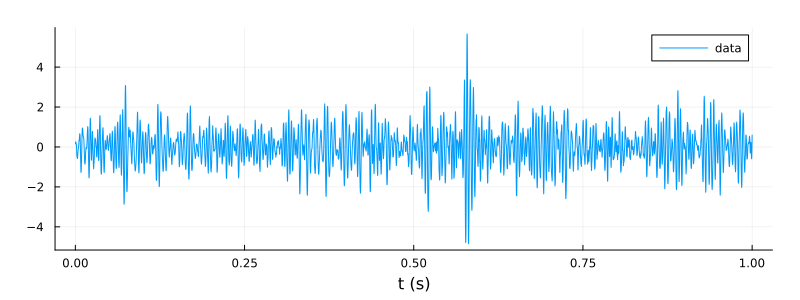

In [97]:
plot(t_data,y_data,size = (800,300), label= "data",margin=5Plots.mm)
xlabel!("t (s)")

In [98]:
savefig("Realdata.png")

"/Users/nguyenhuuminhhoang/PhD/GaussianProcessNode/Realdata.png"

### Hilbert Envelope

In [99]:
HE_env = abs.(hilbert(y_data));
HE_carrier = y_data ./ HE_env;

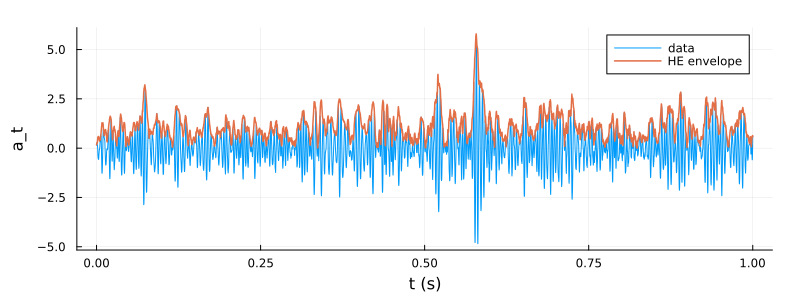

In [101]:
plot(t_data, y_data,label="data")
plot!(t_data, HE_env,size = (800,300),linewidth=1.5,label= "HE envelope",margin=5Plots.mm)
ylabel!("a_t")
xlabel!("t (s)")


In [102]:
savefig("Real_HEenvelope.png")

"/Users/nguyenhuuminhhoang/PhD/GaussianProcessNode/Real_HEenvelope.png"

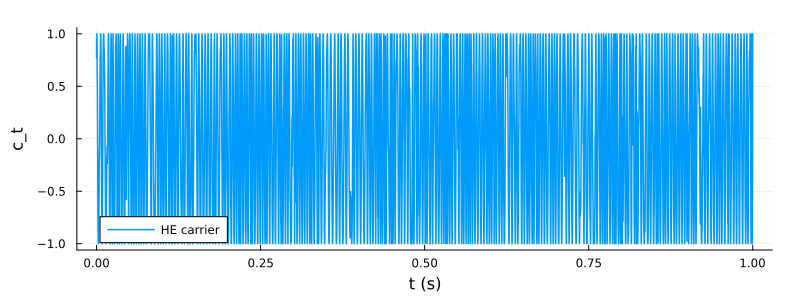

In [105]:
plot(t_data, HE_carrier,size = (800,300),linewidth=1.5, label= "HE carrier", margin=5Plots.mm)
ylabel!("c_t")
xlabel!("t (s)")

In [106]:
savefig("Real_HEcarrier.png")

"/Users/nguyenhuuminhhoang/PhD/GaussianProcessNode/Real_HEcarrier.png"

### SLP envelope

In [107]:
#create a low-pass filter
cutoff_freq = 50
responsetype = Lowpass(cutoff_freq; fs=fs)
designmethod = FIRWindow(hanning(1024))
lowpassFilter = (x) -> filtfilt(digitalfilter(responsetype, designmethod), x)

#113 (generic function with 1 method)

In [108]:
#square the signal 
y_squared = 2*y_data.^2;
SLP_env_squared = lowpassFilter(y_squared);
SLP_env = sqrt.(SLP_env_squared .+ 1e-6);
SLP_carrier = y_data ./ SLP_env;

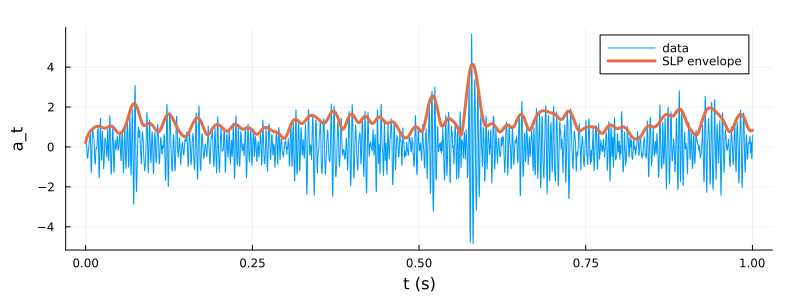

In [109]:
plot(t_data, y_data,size=(800,300), label="data")
plot!(t_data, SLP_env, lw = 3.0, label="SLP envelope",margin=5Plots.mm)
ylabel!("a_t")
xlabel!("t (s)")

In [110]:
savefig("Real_SLPenvelope.png")

"/Users/nguyenhuuminhhoang/PhD/GaussianProcessNode/Real_SLPenvelope.png"

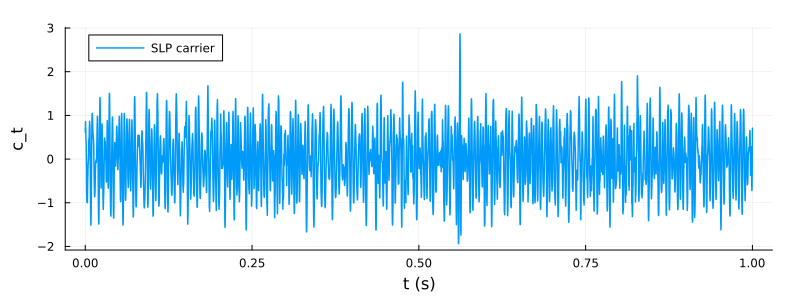

In [112]:
plot(t_data, SLP_carrier,size = (800,300),linewidth=1.5, label= "SLP carrier",margin=5Plots.mm)
xlabel!("t (s)")
ylabel!("c_t")

In [113]:
savefig("Real_SLPcarrier.png")

"/Users/nguyenhuuminhhoang/PhD/GaussianProcessNode/Real_SLPcarrier.png"

### PAD

In [114]:
#GP Amplitude Demodulation model 
@model function gp_AmplitudeDemodulation_Realdata(n, P∞_amplitude,A_amplitude,Q_amplitude,P∞_carrier,A_carrier,Q_carrier,H)
    y = datavar(Float64,n)
    f = randomvar(n)
    z = randomvar(n)
    g = randomvar(n)
    c = randomvar(n)
    # w = randomvar(n)
    d = randomvar(n)
    
    f_0 ~ MvNormalMeanCovariance(zeros(length(H)), P∞_amplitude)
    c_0 ~ MvNormalMeanCovariance(zeros(length(H)), P∞_carrier)
    f_prev = f_0
    c_prev = c_0
    for i=1:n 
        f[i] ~ MvNormalMeanCovariance(A_amplitude[i] * f_prev, Q_amplitude[i])
        z[i] ~ NormalMeanVariance(dot(H , f[i]), 0.6)
        g[i] ~ MyExponential(z[i]) where {pipeline = RequireMessage(x = NormalMeanPrecision(0., 0.5))}

        c[i] ~ MvNormalMeanCovariance(A_carrier[i] * c_prev, Q_carrier[i])
        d[i] ~ NormalMeanVariance(dot(H, c[i]), 0.6) 

        y[i] ~ (*)(d[i],g[i]) where {meta = TinyCorrection(), pipeline = RequireMessage(A = NormalMeanPrecision(0., 0.5))}
        f_prev = f[i]
        c_prev = c[i]
    end
end

In [115]:
#### compute matrices for the state-space model corresponding to Matern-52 kernel ######
θ_amplitude = [0.015, 1.]; # store [l, σ²]
θ_carrier = [0.001, .5]; # store [l, σ²]

Δt = [t_data[2] - t_data[1]]; # time difference
append!(Δt, t_data[2:end] - t_data[1:end-1]);

λ_amplitude = sqrt(5)/θ_amplitude[1];
λ_carrier = sqrt(5)/θ_carrier[1];

L = [0., 0., 1.];
H = [1., 0., 0.];

F_amplitude = [0. 1. 0.; 0. 0. 1.;-λ_amplitude^3 -3λ_amplitude^2 -3λ_amplitude]
F_carrier = [0. 1. 0.; 0. 0. 1.;-λ_carrier^3 -3λ_carrier^2 -3λ_carrier]

Qc_amplitude = 16/3 * θ_amplitude[2] * λ_amplitude^5;
Qc_carrier = 16/3 * θ_carrier[2] * λ_carrier^5;

Imat = diageye(3) ; 

vec_P_amplitude = inv(kron(Imat,F_amplitude) + kron(F_amplitude,Imat)) * vec(-L * Qc_amplitude * L'); 
vec_P_carrier = inv(kron(Imat,F_carrier) + kron(F_carrier,Imat)) * vec(-L * Qc_carrier * L'); 

P∞_amplitude = reshape(vec_P_amplitude,3,3);
P∞_carrier = reshape(vec_P_carrier,3,3);

A_amplitude = [exp(F_amplitude * i) for i in Δt]; 
Q_amplitude = [P∞_amplitude - i*P∞_amplitude*i' for i in A_amplitude];

A_carrier = [exp(F_carrier * i) for i in Δt]; 
Q_carrier = [P∞_carrier - i*P∞_carrier*i' for i in A_carrier];

In [116]:
nits =3

iresult = inference(
    model = gp_AmplitudeDemodulation_Realdata(length(y_data), P∞_amplitude,A_amplitude,Q_amplitude, P∞_carrier,A_carrier,Q_carrier,H),
    iterations = nits, 
    data  = (y = y_data,),
    returnvars = (f = KeepLast(),c = KeepLast(),),
    options = (limit_stack_depth=100,),
    showprogress = false
)

Inference results:
  Posteriors       | available for (f, c)


In [117]:
mgp = mean.(iresult.posteriors[:f]) |> slicedim(1)
vgp = var.(iresult.posteriors[:f]) |> slicedim(1)
var_PAD_env = exp.( mgp .+ vgp)
PAD_env = exp.(mgp);

PAD_carrier = mean.(iresult.posteriors[:c]) |> slicedim(1)
var_PAD_carrier = var.(iresult.posteriors[:c]) |> slicedim(1);

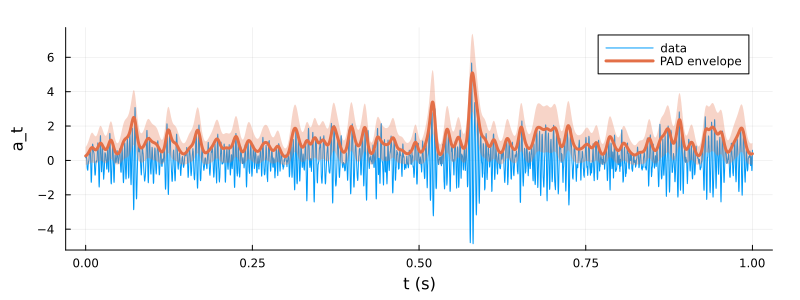

In [118]:
plot(t_data,y_data, label="data")
plot!(t_data,PAD_env,ribbon=sqrt.(var_PAD_env),linewidth=3.0,label="PAD envelope",fillalpha=0.3,size=(800,300),margin=5Plots.mm)
xlabel!("t (s)")
ylabel!("a_t")

In [119]:
savefig("Real_PADenvelope.png")

"/Users/nguyenhuuminhhoang/PhD/GaussianProcessNode/Real_PADenvelope.png"

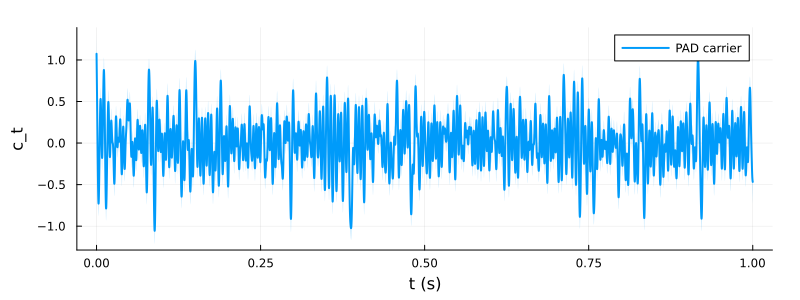

In [120]:
plot(t_data, PAD_carrier ,ribbon=sqrt.((var_PAD_carrier)),label="PAD carrier",linewidth=2.0, fillalpha=0.2, size=(800,300),margin=5Plots.mm)
xlabel!("t (s)")
ylabel!("c_t")

In [121]:
savefig("Real_PADcarrier.png")

"/Users/nguyenhuuminhhoang/PhD/GaussianProcessNode/Real_PADcarrier.png"